## Importing Libraries

In [1]:
import tensorflow.keras as keras
from tensorflow.keras import backend as K
import numpy as np
from IPython.display import display
from keras.layers import Lambda, Conv2D, MaxPooling2D, Dropout, Dense, Flatten
%matplotlib inline

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import cv2

## Importing the Data

In [3]:
#import data
df = pd.read_csv("augmented_data.csv")
#checking info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14866 entries, 0 to 14865
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  14866 non-null  int64  
 1   index       14866 non-null  int64  
 2   image_path  14866 non-null  object 
 3   steering    14866 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 464.7+ KB


In [4]:
length = df["index"][-1::]
split = int(length/100*80) #80% for training 20% for testing
print(split)


11892


In [5]:
#shuffling the set before we split it
df_shuffled = df.sample(frac=1)

In [6]:
#print header to see if it shuffled
df_shuffled.head()

,Unnamed: 0,index,image_path,steering
8583,8583,8583,learning_images//8583.jpeg,0.131455
9029,9029,9029,learning_images//9029.jpeg,0.004695
4366,4366,4366,learning_images//4366.jpeg,0.014085
3363,3363,3363,learning_images//3363.jpeg,0.000000
1825,1825,1825,learning_images//1825.jpeg,-0.028169


In [7]:
#placeholders, ram intensive - might crash on lower end machines
x_train = np.full((split,160,320,3),0)
x_test = np.full((int(length-split+1),160,320,3),0)

In [8]:
#split in training and testing data
#x holds the image
#y holds the steering input
train = df_shuffled.iloc[:split,:]
test = df_shuffled.iloc[split:,:]

#training data
x_train_path = train["image_path"]
y_train = train["steering"]

#testing data
x_test_path = test["image_path"]
y_test = test["steering"]

#import all images from paths, might be ram intensive 16gb or more might be required
index = 0
for path in x_train_path:
    x_train[index] = cv2.imread(path)
    index = index + 1

    
#for test set as well
index = 0
for path in x_test_path:
    x_test[index] = cv2.imread(path)
    index = index + 1



In [9]:
#reset indexes
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [10]:
#checking outputs
print(x_train[0])
print(y_train[0])

[[[231 185 154]
  [214 168 137]
  [222 177 144]
  ...
  [182 139 118]
  [186 138 120]
  [188 138 120]]

 [[206 156 126]
  [246 196 166]
  [219 170 138]
  ...
  [182 139 118]
  [186 138 120]
  [188 138 120]]

 [[240 184 155]
  [227 171 142]
  [246 189 158]
  ...
  [183 140 119]
  [185 139 121]
  [187 139 121]]

 ...

 [[ 90 111 109]
  [112 133 131]
  [ 96 117 115]
  ...
  [130 139 136]
  [ 89  98  95]
  [ 72  81  78]]

 [[113 134 132]
  [117 138 136]
  [123 144 142]
  ...
  [143 152 149]
  [229 238 235]
  [169 178 175]]

 [[118 139 137]
  [124 145 143]
  [100 121 119]
  ...
  [ 97 106 103]
  [102 111 108]
  [128 137 134]]]
0.1314554


In [11]:
#check if y has been extracted properly
y_train

0        0.131455
1        0.004695
2        0.014085
3        0.000000
4       -0.028169
           ...   
11887   -0.037559
11888    0.075117
11889   -0.342723
11890    0.018779
11891   -0.004695
Name: steering, Length: 11892, dtype: float64

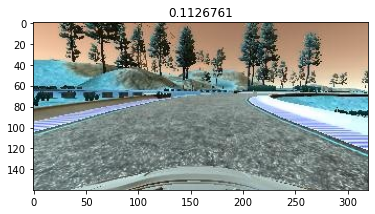

In [12]:
#checking if it seems like the right input for that frame
#show an example image
plt.imshow(x_train[44])
plt.title(y_train[44])
plt.show()



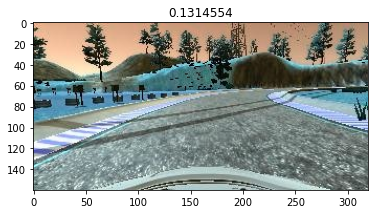

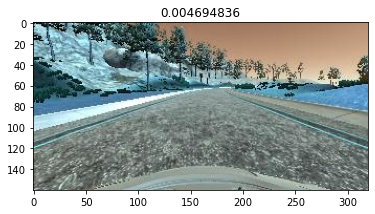

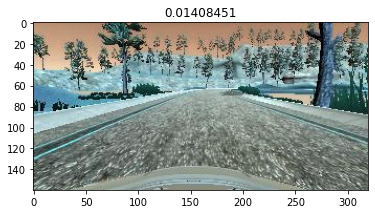

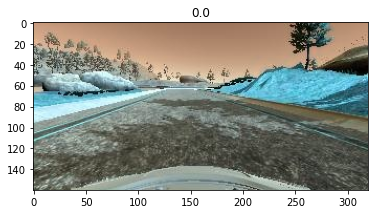

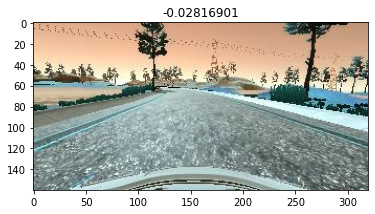

...

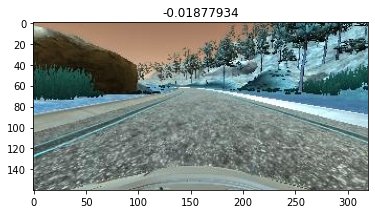

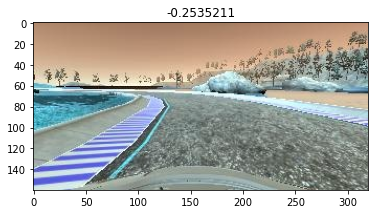

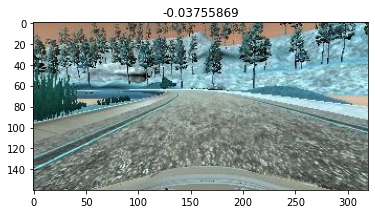

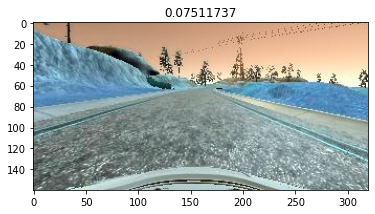

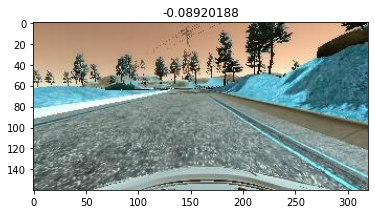

In [13]:
#show many examples
for i in range(50):
    plt.imshow(x_train[i])
    plt.title(y_train[i])
    plt.show()

## Preprocessing of the images

In [14]:
#goal shape of image, and other parameters
gausblur = 3
height = 60
width = 200

In [15]:
#create function that cuts and resizes the image
#this way we only see the relevant information
def resize(image):    
    image = image[60:130,:,:]    #crops image
    image = np.float32(image)
    image = cv2.cvtColor(image,cv2.COLOR_RGB2YUV)
    image = cv2.GaussianBlur(image,(gausblur,gausblur),0)
    image = cv2.resize(image,(width,height))
    image = image/255   
    return image
def random_flip(image,steering_angle):
     if np.random.rand() < 0.5:
        image = cv2.flip(image, 1)
        steering_angle = -steering_angle
     return image, steering_angle

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


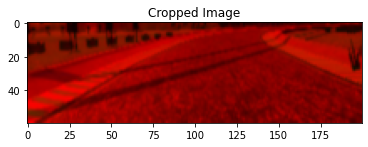

In [16]:
#print test image
plt.imshow(resize(x_train[0]))
plt.title("Cropped Image")
plt.show()

In [17]:
#create new arrays that have the right dimensions
x_train_processed = np.float32(np.full((split,height,width,3),0))
x_test_processed = np.float32(np.full((int(length-split+1),height,width,3),0))

In [18]:
#now do this for every image that is currenlty loaded in the x_train and x_test datasets

#first for training set
for index in range(len(x_train)):
    x_train_processed[index] = resize(x_train[index])
    x_train_processed[index],y_train[index] = random_flip(x_train_processed[index],y_train[index])
    
#for testing set
for index in range(len(x_test)):
    x_test_processed[index] = resize(x_test[index])
    x_test_processed[index],y_test[index] = random_flip(x_test_processed[index],y_test[index])
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


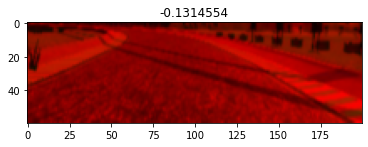

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


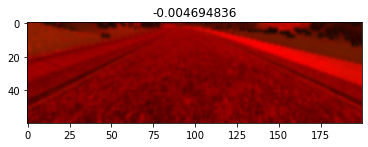

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


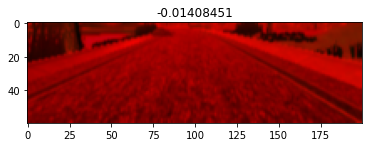

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


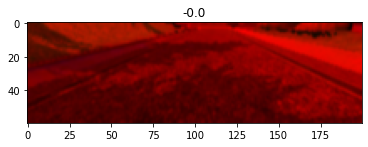

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


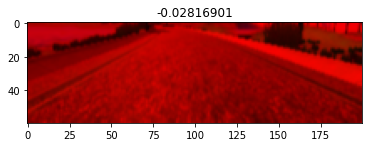

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


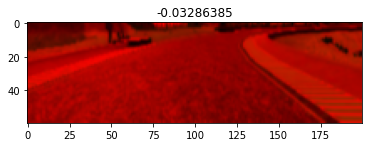

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


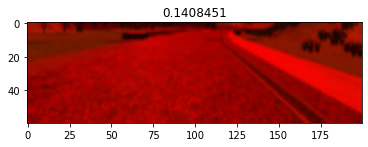

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


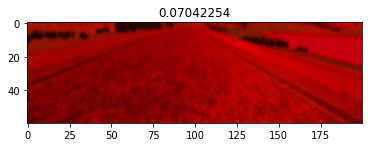

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


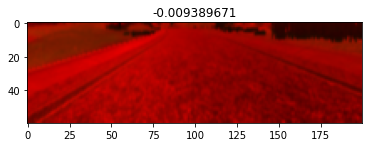

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


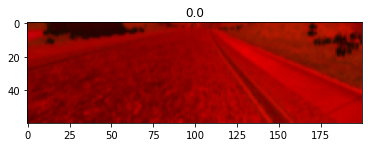

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


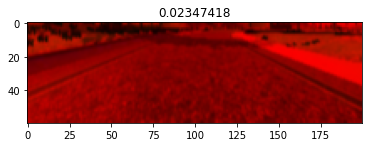

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


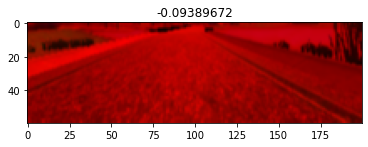

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


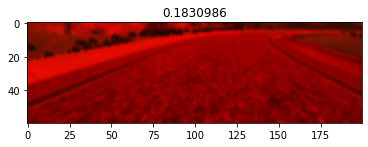

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


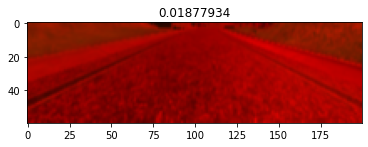

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


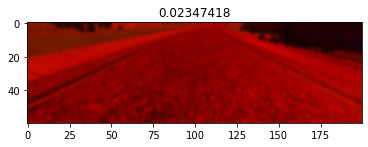

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


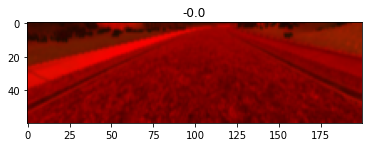

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


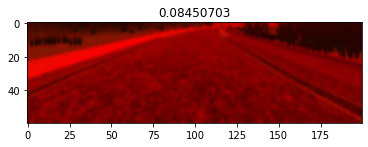

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


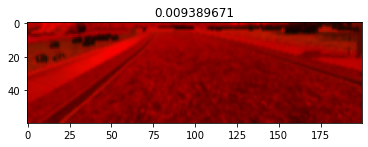

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


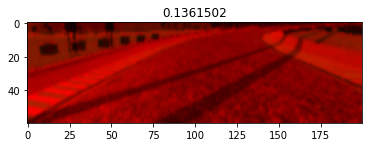

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


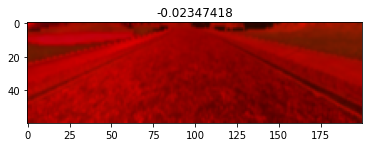

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


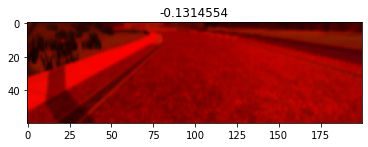

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


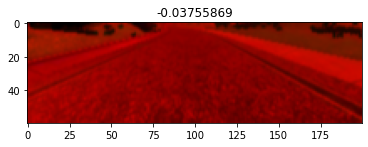

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


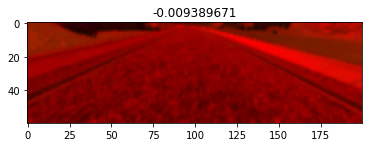

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


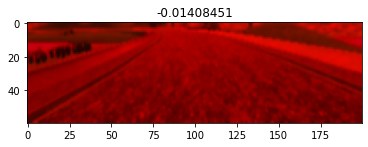

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


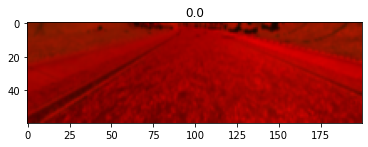

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


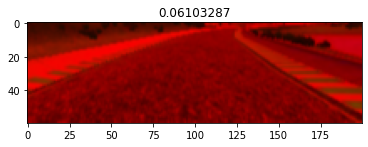

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


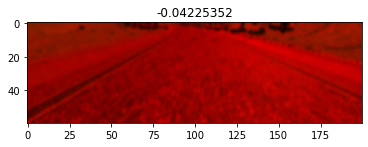

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


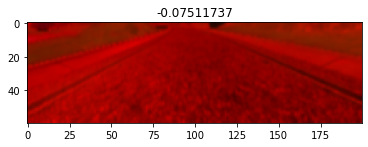

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


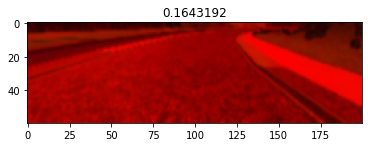

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


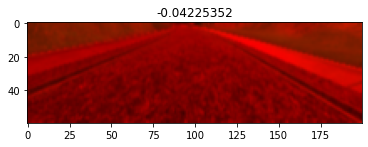

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


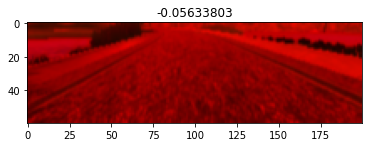

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


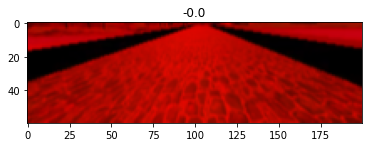

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


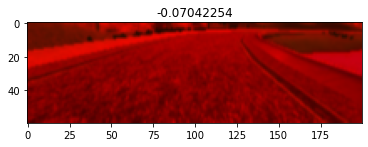

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


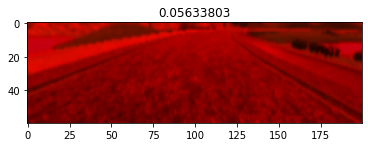

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


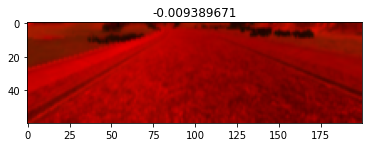

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


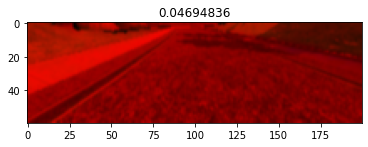

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


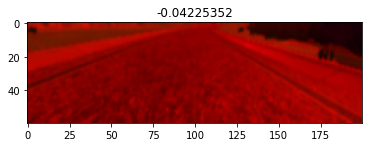

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


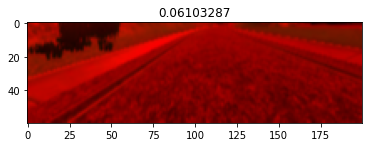

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


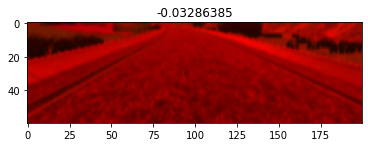

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


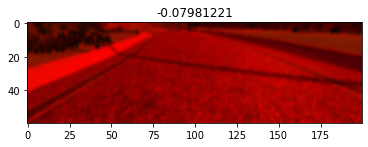

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


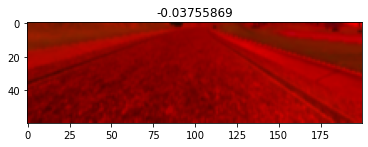

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


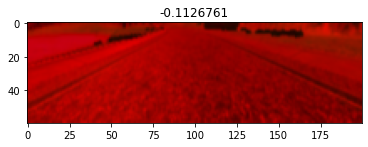

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


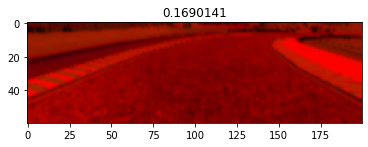

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


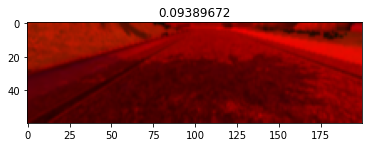

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


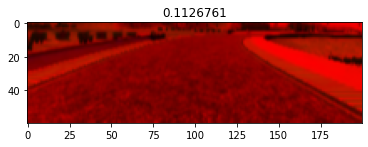

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


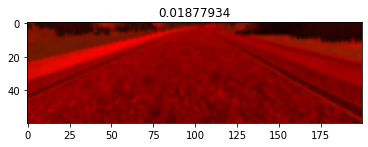

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


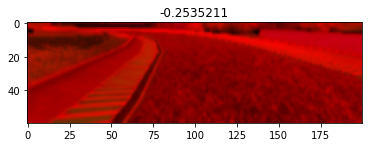

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


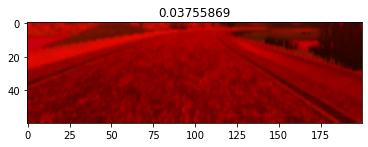

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


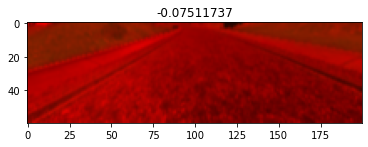

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


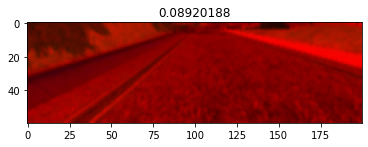

In [19]:
#show many examples
for i in range(50):
    plt.imshow(x_train_processed[i])
    plt.title(y_train[i])
    plt.show()

## Creating The Model

#### now that we have prepared the data for learning, we start building the model

In [20]:
#import more libraries
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D,Flatten,Dense
from tensorflow.keras.optimizers import Adam
import tensorflow.keras as keras

In [22]:
#parameters for learning
learningRate = 0.0001
a=60
b=200
c=3
inputShape = a,b,c

In [23]:
#model that seems to work well with self driving carss

model = Sequential()
model.add(Lambda(lambda x: x/127.5-1.0, input_shape=inputShape))
model.add(Conv2D(24, (5, 5), activation='elu', strides=(2, 2)))
model.add(Conv2D(36, (5, 5), activation='elu', strides=(2, 2)))
model.add(Conv2D(48, (5, 5), activation='elu', strides=(2, 2)))
model.add(Conv2D(64, 3, 3, activation='elu',padding="same"))
model.add(Conv2D(64, 3, 3, activation='elu',padding="same"))
model.add(Dropout(.5))
model.add(Flatten())
model.add(Dense(100, activation='elu'))
model.add(Dense(50, activation='elu'))
model.add(Dense(10, activation='elu'))
model.add(Dense(1))
model.compile(optimizer=keras.optimizers.Adam(learning_rate = learningRate),loss='mse')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 60, 200, 3)        0         
                                                                 
 conv2d (Conv2D)             (None, 28, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 2, 8, 64)          27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 3, 64)          36928     
                                                                 
 dropout (Dropout)           (None, 1, 3, 64)         

In [24]:
#fit the model to our data
history = model.fit(x_train_processed,y_train,
         epochs=500,
         verbose=1,
         validation_split=0.1,
         steps_per_epoch=1200,
         validation_steps=50
         )

Epoch 1/500
1200/1200 [==============================] - 25s 20ms/step - loss: 0.0126 - val_loss: 0.0096
Epoch 2/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0093 - val_loss: 0.0104
Epoch 3/500
1200/1200 [==============================] - 25s 21ms/step - loss: 0.0091 - val_loss: 0.0095
Epoch 4/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0089 - val_loss: 0.0095
Epoch 5/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0090 - val_loss: 0.0095
Epoch 6/500
1200/1200 [==============================] - 25s 20ms/step - loss: 0.0089 - val_loss: 0.0096
Epoch 7/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0090 - val_loss: 0.0095
Epoch 8/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0088 - val_loss: 0.0095
Epoch 9/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0091 - val_loss: 0.0095
Epoch 10/500
1200/1200 [==============================]

1200/1200 [==============================] - 24s 20ms/step - loss: 0.0022 - val_loss: 0.0030
Epoch 79/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0021 - val_loss: 0.0029
Epoch 80/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0022 - val_loss: 0.0028
Epoch 81/500
1200/1200 [==============================] - 23s 20ms/step - loss: 0.0021 - val_loss: 0.0029
Epoch 82/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0021 - val_loss: 0.0030
Epoch 83/500
1200/1200 [==============================] - 23s 20ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 84/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0021 - val_loss: 0.0029
Epoch 85/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 86/500
1200/1200 [==============================] - 24s 20ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 87/500
1200/1200 [==============================] - 2

Epoch 155/500
1200/1200 [==============================] - 30s 25ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 156/500
1200/1200 [==============================] - 29s 24ms/step - loss: 0.0012 - val_loss: 0.0032
Epoch 157/500
1200/1200 [==============================] - 29s 24ms/step - loss: 0.0012 - val_loss: 0.0030
Epoch 158/500
1200/1200 [==============================] - 27s 23ms/step - loss: 0.0012 - val_loss: 0.0029
Epoch 159/500
1200/1200 [==============================] - 25s 21ms/step - loss: 0.0012 - val_loss: 0.0030
Epoch 160/500
1200/1200 [==============================] - 25s 21ms/step - loss: 0.0011 - val_loss: 0.0029
Epoch 161/500
1200/1200 [==============================] - 26s 22ms/step - loss: 0.0012 - val_loss: 0.0029
Epoch 162/500
1200/1200 [==============================] - 28s 24ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 163/500
1200/1200 [==============================] - 25s 21ms/step - loss: 0.0012 - val_loss: 0.0029
Epoch 164/500
1200/1200 [============

1200/1200 [==============================] - 25s 21ms/step - loss: 7.9981e-04 - val_loss: 0.0029
Epoch 231/500
1200/1200 [==============================] - 25s 21ms/step - loss: 8.1541e-04 - val_loss: 0.0027
Epoch 232/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.9538e-04 - val_loss: 0.0027
Epoch 233/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.8072e-04 - val_loss: 0.0028
Epoch 234/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.6883e-04 - val_loss: 0.0028
Epoch 235/500
1200/1200 [==============================] - 25s 21ms/step - loss: 8.1329e-04 - val_loss: 0.0029
Epoch 236/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.9028e-04 - val_loss: 0.0028
Epoch 237/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.8389e-04 - val_loss: 0.0028
Epoch 238/500
1200/1200 [==============================] - 25s 21ms/step - loss: 7.7471e-04 - val_loss: 0.0029
Epoch 239/500
1

Epoch 304/500
1200/1200 [==============================] - 26s 21ms/step - loss: 5.8546e-04 - val_loss: 0.0026
Epoch 305/500
1200/1200 [==============================] - 25s 21ms/step - loss: 6.0345e-04 - val_loss: 0.0026
Epoch 306/500
1200/1200 [==============================] - 25s 21ms/step - loss: 6.0165e-04 - val_loss: 0.0025
Epoch 307/500
1200/1200 [==============================] - 25s 21ms/step - loss: 5.9636e-04 - val_loss: 0.0025
Epoch 308/500
1200/1200 [==============================] - 25s 21ms/step - loss: 6.2277e-04 - val_loss: 0.0026
Epoch 309/500
1200/1200 [==============================] - 25s 21ms/step - loss: 5.7826e-04 - val_loss: 0.0026
Epoch 310/500
1200/1200 [==============================] - 25s 21ms/step - loss: 5.8691e-04 - val_loss: 0.0026
Epoch 311/500
1200/1200 [==============================] - 26s 21ms/step - loss: 5.7697e-04 - val_loss: 0.0027
Epoch 312/500
1200/1200 [==============================] - 26s 21ms/step - loss: 5.5472e-04 - val_loss: 0.0026
E

Epoch 378/500
1200/1200 [==============================] - 25s 21ms/step - loss: 5.0825e-04 - val_loss: 0.0025
Epoch 379/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.8478e-04 - val_loss: 0.0026
Epoch 380/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.7118e-04 - val_loss: 0.0025
Epoch 381/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.7374e-04 - val_loss: 0.0026
Epoch 382/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.6090e-04 - val_loss: 0.0026
Epoch 383/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.8475e-04 - val_loss: 0.0025
Epoch 384/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.5784e-04 - val_loss: 0.0027
Epoch 385/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.6587e-04 - val_loss: 0.0026
Epoch 386/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.6174e-04 - val_loss: 0.0026
E

Epoch 452/500
1200/1200 [==============================] - 26s 21ms/step - loss: 3.9960e-04 - val_loss: 0.0025
Epoch 453/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.0198e-04 - val_loss: 0.0026
Epoch 454/500
1200/1200 [==============================] - 26s 22ms/step - loss: 3.8983e-04 - val_loss: 0.0026
Epoch 455/500
1200/1200 [==============================] - 25s 21ms/step - loss: 4.1116e-04 - val_loss: 0.0025
Epoch 456/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.1680e-04 - val_loss: 0.0026
Epoch 457/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.1048e-04 - val_loss: 0.0026
Epoch 458/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.0085e-04 - val_loss: 0.0025
Epoch 459/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.0681e-04 - val_loss: 0.0025
Epoch 460/500
1200/1200 [==============================] - 26s 21ms/step - loss: 4.0851e-04 - val_loss: 0.0026
E

In [27]:
#save model
model.save("Test_Model.h5")

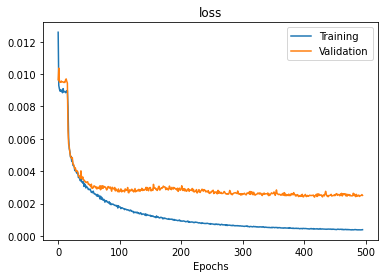

In [25]:
#plot performance
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("loss")
plt.legend(["Training","Validation"])
plt.xlabel("Epochs")
plt.show()

In [28]:
data= model.predict(x_test_processed)

[]

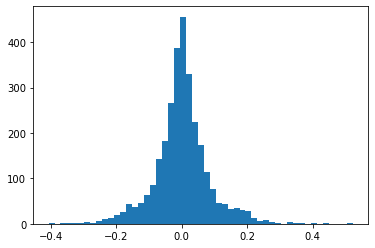

In [29]:
plt.hist(data,bins=51)
plt.plot()